In [1]:
import numpy as np
import os
import six.moves.urllib as urllib
import sys
import tarfile
import tensorflow as tf
import zipfile
import pathlib
from collections import defaultdict
from io import StringIO
from matplotlib import pyplot as plt
from PIL import Image
import cv2
from IPython.display import display

In [61]:
from object_detection.utils import ops as utils_ops
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as vis_util

In [63]:
PATH_TO_TEST_IMAGES_DIR = pathlib.Path('images/test')
TEST_IMAGE_PATHS = sorted(list(PATH_TO_TEST_IMAGES_DIR.glob("*.jpeg")))
TEST_IMAGE_PATHS

[PosixPath('images/test/1.jpeg'),
 PosixPath('images/test/10.jpeg'),
 PosixPath('images/test/11.jpeg'),
 PosixPath('images/test/12.jpeg'),
 PosixPath('images/test/13.jpeg'),
 PosixPath('images/test/14.jpeg'),
 PosixPath('images/test/15.jpeg'),
 PosixPath('images/test/16.jpeg'),
 PosixPath('images/test/17.jpeg'),
 PosixPath('images/test/18.jpeg'),
 PosixPath('images/test/19.jpeg'),
 PosixPath('images/test/2.jpeg'),
 PosixPath('images/test/20.jpeg'),
 PosixPath('images/test/21.jpeg'),
 PosixPath('images/test/22.jpeg'),
 PosixPath('images/test/23.jpeg'),
 PosixPath('images/test/24.jpeg'),
 PosixPath('images/test/25.jpeg'),
 PosixPath('images/test/26.jpeg'),
 PosixPath('images/test/27.jpeg'),
 PosixPath('images/test/28.jpeg'),
 PosixPath('images/test/29.jpeg'),
 PosixPath('images/test/3.jpeg'),
 PosixPath('images/test/30.jpeg'),
 PosixPath('images/test/31.jpeg'),
 PosixPath('images/test/32.jpeg'),
 PosixPath('images/test/33.jpeg'),
 PosixPath('images/test/34.jpeg'),
 PosixPath('images/test

In [58]:
MODEL_NAME = 'trained-inference-graphs/ssd_inception5000'
CWD_PATH = os.getcwd()
PATH_TO_CKPT = os.path.join(CWD_PATH,MODEL_NAME,'frozen_inference_graph.pb')
PATH_TO_LABELS = os.path.join(CWD_PATH,'annotations','label_map.pbtxt')
NUM_CLASSES = 1
label_map = label_map_util.load_labelmap(PATH_TO_LABELS)
categories = label_map_util.convert_label_map_to_categories(label_map, max_num_classes=NUM_CLASSES, use_display_name=True)
category_index = label_map_util.create_category_index(categories)
 
 
config = tf.ConfigProto()
config.gpu_options.allow_growth=True

detection_graph = tf.Graph()
with detection_graph.as_default():
  od_graph_def = tf.GraphDef()
  with tf.gfile.GFile(PATH_TO_CKPT, 'rb') as fid:
    serialized_graph = fid.read()
    od_graph_def.ParseFromString(serialized_graph)
    tf.import_graph_def(od_graph_def, name='')
  sess = tf.Session(graph=detection_graph,config=config)


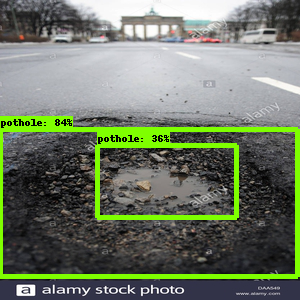

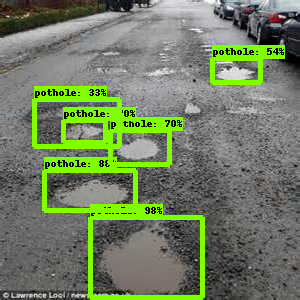

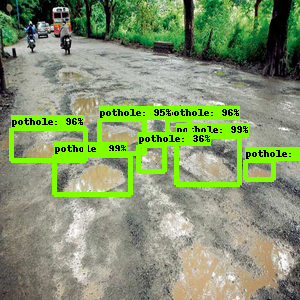

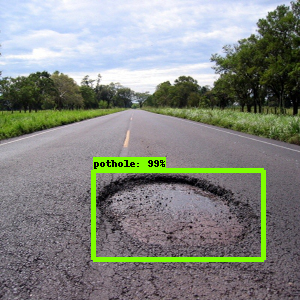

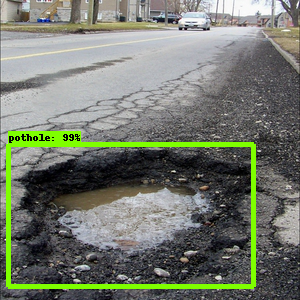

...

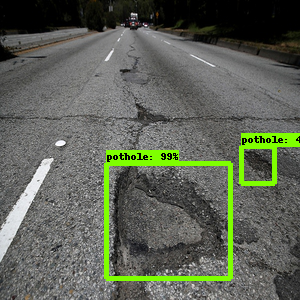

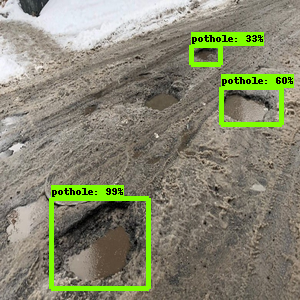

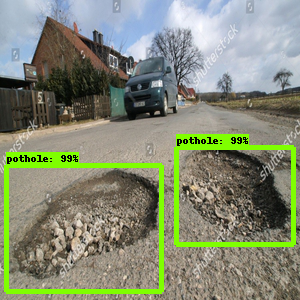

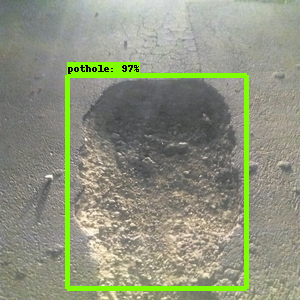

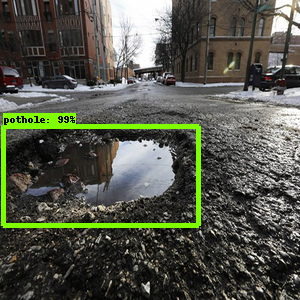

In [65]:
with detection_graph.as_default():
    for image_path in TEST_IMAGE_PATHS:
        image = Image.open(image_path)
        image_np = np.array(image)
        image_np_expanded = np.expand_dims(image_np, axis=0)
        image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')
        boxes = detection_graph.get_tensor_by_name('detection_boxes:0')
        scores = detection_graph.get_tensor_by_name('detection_scores:0')
        classes = detection_graph.get_tensor_by_name('detection_classes:0')
        num_detections = detection_graph.get_tensor_by_name('num_detections:0')
        (boxes, scores, classes, num_detections) = sess.run(
          [boxes, scores, classes, num_detections],
          feed_dict={image_tensor: image_np_expanded})
        vis_util.visualize_boxes_and_labels_on_image_array(
            image_np,
            np.squeeze(boxes),
            np.squeeze(classes).astype(np.int32),
            np.squeeze(scores),
            category_index,
            use_normalized_coordinates=True,
            line_thickness=5,
            min_score_thresh=0.30)
        display(Image.fromarray(image_np))

In [66]:
sess.close()